<a href="https://colab.research.google.com/github/xmpuspus/Lectures/blob/master/notebooks/BreastCancer_AutoMLClassification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Breast Cancer Diagnostics
The dataset includes various information about breast cancer tumors, as well as **classification labels of malignant or benign**. The dataset has **569 instances**, or data on 569 tumors and includes information on **30 features**, such as the **radius of the tumor, texture, smoothness, and area**.

### Objective:  Predict whether or not a tumor is malignant or benign

Scikit-learn comes installed with various datasets which we can load into Python, and the dataset we want is included. Import and load the dataset:

In [0]:
# IMPORT GENERIC PACKAGES
import numpy as np # numerical calc package
import pandas as pd # holds data
import matplotlib.pyplot as plt # plotting library
import seaborn as sns # pretty plotting
sns.set(rc={'figure.figsize':(20,10)}) # set pretty plot formatting

# IMPORT MACHINE LEARNING PACKAGES
from sklearn.model_selection import train_test_split # used to split dataset
from sklearn.metrics import confusion_matrix as cf # used to print out confusion matrix

In [0]:
!pip install tpot;

In [0]:
from tpot import TPOTClassifier

In [0]:
from sklearn.datasets import load_breast_cancer

# Load dataset
data = load_breast_cancer()

## Variables  

The *data* variable represents a Python object that works like a dictionary. The important dictionary keys to consider are the classification label names (*target_names*), the actual labels (*target*), the attribute/feature names (*feature_names*), and the attributes (*data*).

Attributes are a critical part of any classifier. Attributes capture important characteristics about the nature of the data.  

Given the label we are trying to predict (malignant versus benign tumor), possible useful attributes include the size, radius, and texture of the tumor.

Create new variables for each important set of information and assign the data:



In [0]:
# Organize our data
label_names = data['target_names']
labels = data['target']
feature_names = data['feature_names']
features = data['data']


# Look at our data
data_df = pd.DataFrame(features, columns = feature_names)
data_df['target'] = labels
print (data_df.shape)



(569, 31)


In [0]:
# look at first few lines of the data
data_df.head()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,target
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,0
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,0
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,0
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,0
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,0


### Data Visualization

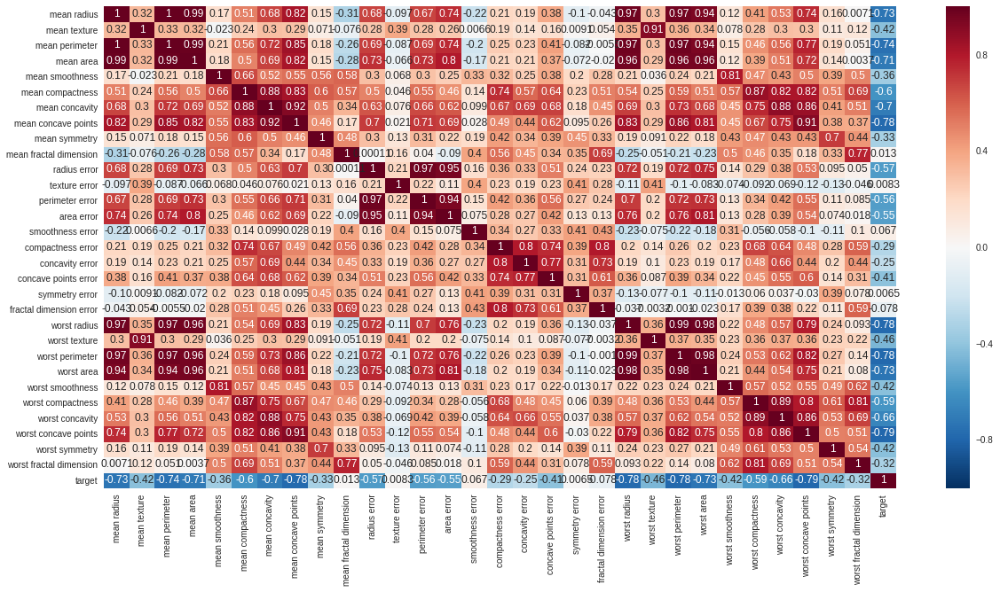

In [0]:
# Visualize the data

sns.heatmap(data_df.corr(), annot=True)

From the figure above, we can see the features that are negatively correlated with breast cancer malignance. This means, the **smaller these features** are (*mean radius*, *mean perimeter*, etc), the **more chances of being benign**.

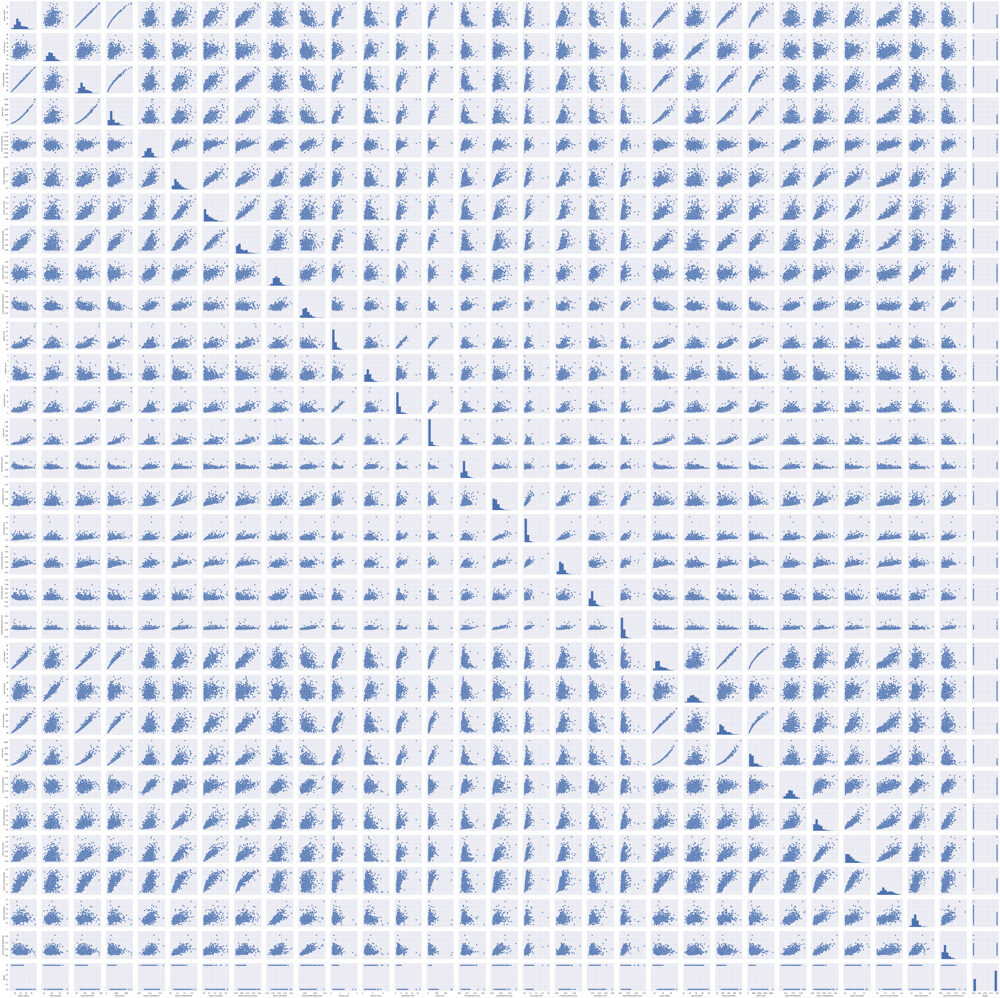

In [0]:
# produce distributions and correlations
sns.pairplot(data_df)

Most of the **features are highly correlated** to each other simply because some of the columns are derivative of the others. 

# Auto-Machine Learning  

I use TPOT for automated machine learning. 

In [0]:
X = data_df[feature_names]
y = data_df['target']

# Split the data 75-25
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.75, test_size=0.25)

In [0]:
tpot = TPOTClassifier(generations=10, max_time_mins=5, max_eval_time_mins=0.01, population_size=50, verbosity=2)
tpot.fit(X_train, y_train)
print(tpot.score(X_test, y_test))

Optimization Progress: 124pipeline [00:45,  2.50pipeline/s]

Generation 1 - Current best internal CV score: 0.976497948016416


Optimization Progress: 177pipeline [01:13,  1.85pipeline/s]

Generation 2 - Current best internal CV score: 0.976497948016416


Optimization Progress: 234pipeline [01:51,  1.45pipeline/s]

Generation 3 - Current best internal CV score: 0.976497948016416


Optimization Progress: 292pipeline [02:27,  1.56pipeline/s]

Generation 4 - Current best internal CV score: 0.976497948016416


Optimization Progress: 350pipeline [03:06,  1.65pipeline/s]

Generation 5 - Current best internal CV score: 0.976497948016416


Optimization Progress: 407pipeline [03:44,  1.51pipeline/s]

Generation 6 - Current best internal CV score: 0.9812038303693571


Optimization Progress: 464pipeline [04:18,  1.96pipeline/s]

Generation 7 - Current best internal CV score: 0.9812038303693571


Optimization Progress: 521pipeline [04:52,  1.99pipeline/s]

Generation 8 - Current best internal CV score: 0.9812038303693571



5.0081561 minutes have elapsed. TPOT will close down.
TPOT closed prematurely. Will use the current best pipeline.

Best pipeline: LogisticRegression(MinMaxScaler(VarianceThreshold(PolynomialFeatures(input_matrix, degree=2, include_bias=False, interaction_only=False), threshold=0.0001)), C=10.0, dual=True, penalty=l2)
0.972027972027972


In [0]:
pd.DataFrame(dict(list(tpot.evaluated_individuals_.items()))).T\
.replace([np.inf, -np.inf], np.nan)\
.dropna()\
.drop('generation', axis = 1)\
.sort_values('internal_cv_score', ascending = False)\
.head()

,crossover_count,internal_cv_score,mutation_count,operator_count,predecessor
"LogisticRegression(MinMaxScaler(VarianceThreshold(PolynomialFeatures(input_matrix, PolynomialFeatures__degree=2, PolynomialFeatures__include_bias=False, PolynomialFeatures__interaction_only=False), VarianceThreshold__threshold=0.0001)), LogisticRegression__C=10.0, LogisticRegression__dual=True, LogisticRegression__penalty=l2)",0,0.981204,2,4.0,(LogisticRegression(MinMaxScaler(VarianceThres...
"LogisticRegression(MinMaxScaler(VarianceThreshold(PolynomialFeatures(input_matrix, PolynomialFeatures__degree=2, PolynomialFeatures__include_bias=False, PolynomialFeatures__interaction_only=False), VarianceThreshold__threshold=0.01)), LogisticRegression__C=10.0, LogisticRegression__dual=True, LogisticRegression__penalty=l2)",0,0.981204,3,4.0,(LogisticRegression(MinMaxScaler(VarianceThres...
"LogisticRegression(MinMaxScaler(MinMaxScaler(VarianceThreshold(input_matrix, VarianceThreshold__threshold=0.0001))), LogisticRegression__C=10.0, LogisticRegression__dual=True, LogisticRegression__penalty=l2)",0,0.976498,2,4.0,(LogisticRegression(MinMaxScaler(VarianceThres...
"LogisticRegression(MinMaxScaler(VarianceThreshold(input_matrix, VarianceThreshold__threshold=0.0001)), LogisticRegression__C=10.0, LogisticRegression__dual=True, LogisticRegression__penalty=l2)",0,0.976498,1,3.0,(LogisticRegression(MinMaxScaler(input_matrix)...
"GradientBoostingClassifier(CombineDFs(input_matrix, input_matrix), GradientBoostingClassifier__learning_rate=0.5, GradientBoostingClassifier__max_depth=8, GradientBoostingClassifier__max_features=0.05, GradientBoostingClassifier__min_samples_leaf=16, GradientBoostingClassifier__min_samples_split=12, GradientBoostingClassifier__n_estimators=100, GradientBoostingClassifier__subsample=0.7500000000000001)",0,0.974200,4,1.0,(GradientBoostingClassifier(Normalizer(input_m...


In [0]:
y_pred = tpot.predict(X_test)

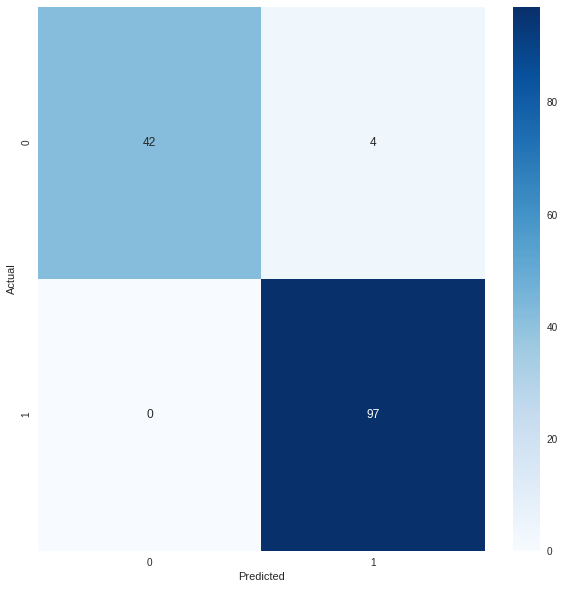

In [0]:
conf_mat = cf(y_test, y_pred)
fig, ax = plt.subplots(figsize=(10,10))
sns.heatmap(conf_mat, annot=True, fmt='d', cmap='Blues')
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()